#### Part 2: EDA of the Provided Dataset

##### A. Study Area

In [224]:
# import libraries
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import xarray as xr
import zarr 
import gcsfs
import cdsapi
import climetlab as cml
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.img_tiles import Stamen
from IPython.display import display
from scipy.stats import linregress
import matplotlib.animation as animation
from IPython.display import HTML

In [225]:
# Load the dataset
ds = xr.open_dataset("/Users/taniadiamanta/UOM/Semester 2/EarthAndEnvironmentalDS/Coursework2/preprocessed_merged_dataset.nc")
ds

<xarray.Dataset> Size: 72MB
Dimensions:     (time: 27374, lat: 11, lon: 6)
Coordinates:
  * lat         (lat) float32 44B 49.48 50.42 51.36 52.3 ... 57.02 57.96 58.9
  * lon         (lon) float32 24B 352.5 353.8 355.0 356.2 357.5 358.8
  * time        (time) datetime64[ns] 219kB 2006-01-02 2006-01-03 ... 2080-12-12
Data variables:
    TREFMXAV_U  (time, lat, lon) float64 14MB ...
    FLNS        (time, lat, lon) float32 7MB ...
    FSNS        (time, lat, lon) float32 7MB ...
    PRECT       (time, lat, lon) float32 7MB ...
    PRSN        (time, lat, lon) float32 7MB ...
    QBOT        (time, lat, lon) float32 7MB ...
    TREFHT      (time, lat, lon) float32 7MB ...
    UBOT        (time, lat, lon) float32 7MB ...
    VBOT        (time, lat, lon) float32 7MB ...

In [227]:
# Extract latitudes and longitudes
lats = ds.lat.values
lons = ds.lon.values

In [228]:
# Convert longitudes if they are in 0–360 range
lons = np.where(lons > 180, lons - 360, lons)

In [229]:
# Create meshgrid for plotting
lon_grid, lat_grid = np.meshgrid(lons, lats)

In [230]:
# Define cities with their coordinates
cities = {
    "Manchester": (-2.2426, 53.4808),
    "Edinburgh": (-3.1883, 55.9533),
    "London": (-0.1276, 51.5074),
    "Belfast": (-5.9301, 54.5973),
    "Dublin": (-6.2603, 53.3498),
    "Birmingham": (-1.8998, 52.4862),
    "Cardiff": (-3.1791, 51.4816),
}

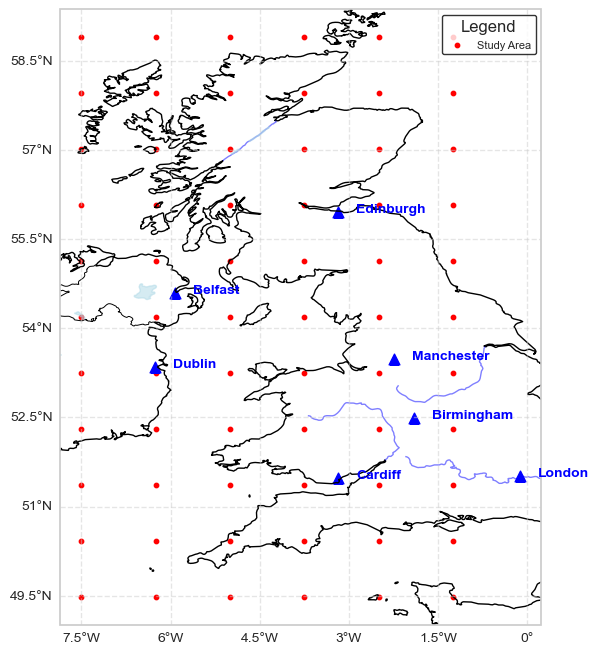

In [231]:
# Plot
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Add coastlines, borders, rivers, and lakes
ax.coastlines(color='black', linewidth=1)
ax.add_feature(cfeature.BORDERS, edgecolor='black', linewidth=0.7)
ax.add_feature(cfeature.RIVERS, edgecolor='blue', alpha=0.5)
ax.add_feature(cfeature.LAKES, color='lightblue', alpha=0.5)

# Add gridlines
grid = ax.gridlines(draw_labels=True, linestyle="--", alpha=0.5)
grid.top_labels = False
grid.right_labels = False
grid.xlabel_style = {'fontsize': 10}
grid.ylabel_style = {'fontsize': 10}

# Plot study area points
plt.scatter(lon_grid, lat_grid, color='red', s=10, transform=ccrs.PlateCarree(), label="Study Area")

# Plot cities
for city, (lon, lat) in cities.items():
    ax.scatter(lon, lat, color='blue', s=60, transform=ccrs.PlateCarree(), marker='^')
    ax.text(lon + 0.3, lat, city, fontsize=10, transform=ccrs.PlateCarree(), color='blue', fontweight='bold')

# Add legend
plt.legend(loc="upper right", fontsize=8, frameon=True, edgecolor='black', title="Legend")

# Save map to jpg
plt.savefig("study_area_map.jpg", dpi=300, bbox_inches="tight", format="jpg")

# Show the plot
plt.show()

##### B. Summary Statistics

In [232]:
# Summary statistics
summary_stats = {}
for var in ds.data_vars:
    data = ds[var].values.flatten()  # Flatten to a 1D array
    stats = {
        "count": len(data),
        "mean": float(pd.Series(data).mean()),
        "std": float(pd.Series(data).std()),
        "min": float(pd.Series(data).min()),
        "25%": float(pd.Series(data).quantile(0.25)),
        "50% (median)": float(pd.Series(data).median()),
        "75%": float(pd.Series(data).quantile(0.75)),
        "max": float(pd.Series(data).max()),
    }
    summary_stats[var] = stats

# Convert to DataFrame
summary_stats_df = pd.DataFrame(summary_stats)

# Round up for all variables except PRSN and PRECT
for col in summary_stats_df.columns:
    if col not in ["PRSN", "PRECT"]:
        summary_stats_df[col] = np.ceil(summary_stats_df[col] * 1000) / 1000  # Round up to 3 decimal places

# Display
display(summary_stats_df)

,TREFMXAV_U,FLNS,FSNS,PRECT,PRSN,QBOT,TREFHT,UBOT,VBOT
count,1806684.000,1806684.000,1806684.000,1.806684e+06,1.806684e+06,1806684.000,1806684.000,1806684.000,1806684.000
mean,15.530,48.567,110.329,4.027018e-08,2.391068e-10,0.007,12.191,2.159,1.707
std,3.778,12.949,78.040,2.850635e-08,1.781697e-09,0.002,4.130,2.550,2.460
min,2.708,5.274,2.772,1.378286e-13,0.000000e+00,0.004,-1.524,-9.956,-9.820
25%,13.037,39.338,35.570,1.895466e-08,9.425583e-18,0.006,8.898,0.490,0.036
50% (median),15.035,48.480,100.866,3.397255e-08,6.346412e-16,0.007,11.819,1.854,1.588
75%,18.102,57.669,173.273,5.499691e-08,2.164628e-14,0.009,15.579,3.498,3.274
max,31.865,104.709,337.349,2.869393e-07,1.120892e-07,0.014,24.872,21.057,17.451


Overall, this dataset suggests a climate of an area with moderate temperatures with occasional extreme heat, low average precipitation but the potential for extreme rainfall events, and generally low wind speeds with occasional strong gusts.
- The TREFMXAV_U (maximum temperature) has an average of 15.53°C, with a minimum of 2.71°C and a maximum of 31.87°C, suggesting that extreme high-temperature events do occur.
- The PRECT (precipitation) values are generally very low on average but show occasional extreme values, indicating the presence of intense precipitation events.
- The PRSN (snow precipitation) is minimal, suggesting that snowfall is rare but can occur under certain conditions.
- The UBOT and VBOT variables, representing wind speeds in different directions, indicate that average wind speeds are relatively low, but strong winds or gusts reaching over 21.06 m/s can occur.
- The QBOT (specific humidity) has a low but positive mean value, indicating a relatively humid climate. 

##### C. Analysis of TREFHT

##### C.1 Temporal Analysis

In [233]:
# Enable Seaborn styling
sns.set(style="whitegrid")

# Extract TREFHT and calculate spatial average over lat and lon
trefht = ds["TREFHT"]
trefht_mean_spatial = trefht.mean(dim=["lat", "lon"])  # Result: 1D time series

# Convert to DataFrame for plotting
trefht_df = trefht_mean_spatial.to_dataframe().reset_index()
trefht_df["year"] = trefht_df["time"].dt.year
trefht_df["month"] = trefht_df["time"].dt.month

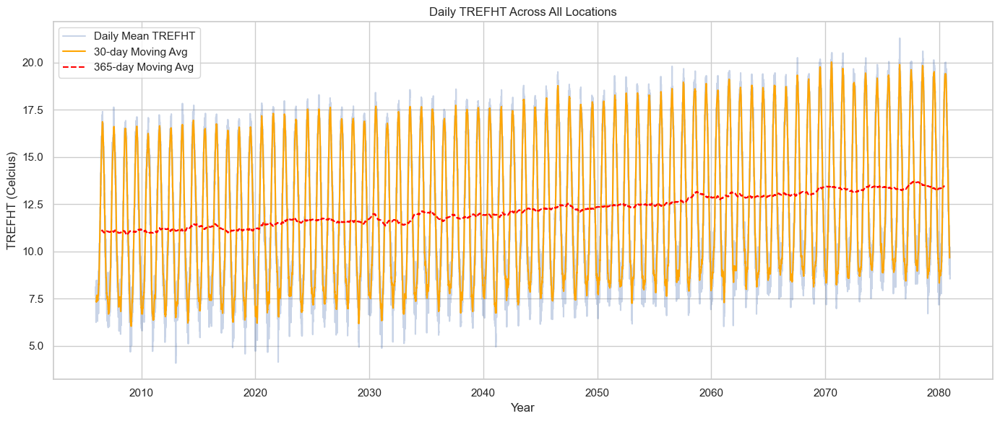

In [234]:
# Set time as index for rolling operations
trefht_df.set_index("time", inplace=True)

# Add moving averages
trefht_df["TREFHT_30d"] = trefht_df["TREFHT"].rolling(window=30, center=True).mean()
trefht_df["TREFHT_365d"] = trefht_df["TREFHT"].rolling(window=365, center=True).mean()

# 1. Spatial Average Time Series with Moving Averages
plt.figure(figsize=(14, 6))
plt.plot(trefht_df.index, trefht_df["TREFHT"], label="Daily Mean TREFHT", alpha=0.3)
plt.plot(trefht_df.index, trefht_df["TREFHT_30d"], color='orange', label="30-day Moving Avg")
plt.plot(trefht_df.index, trefht_df["TREFHT_365d"], color='red', linestyle='--', label="365-day Moving Avg")
plt.title("Daily TREFHT Across All Locations")
plt.xlabel("Year")
plt.ylabel("TREFHT (Celcius)")
plt.legend()
plt.tight_layout()
plt.show()

This graph displays the daily mean TREFHT across all locations from 2006 to 2080.
- The light blue line represents the raw daily temperature values, showing strong seasonal fluctuations with peaks and troughs that suggest a clear annual cycle.
- The orange line (30-day moving average) smooths out short-term variations while preserving seasonal patterns, making it easier to see temperature trends within each year.
- The red dashed line (365-day moving average) highlights the long-term trend, revealing a gradual increase in temperature over the decades.

Overall, this graph suggests a clear warming trend in the dataset over the 21st century, which could be indicative of climate change impacts in the observed region. There is a consistent annual cycle, with temperature peaks in warmer months and troughs in drops months, indicating strong seasonality. Over time, the 365-day moving average follows an upward trajectory, indicating a long-term warming trend in temperature. Additionally, the amplitude of seasonal temperature variations appears to grow in later years, implying that temperature extremes—both highs and lows—may become more pronounced in the future.

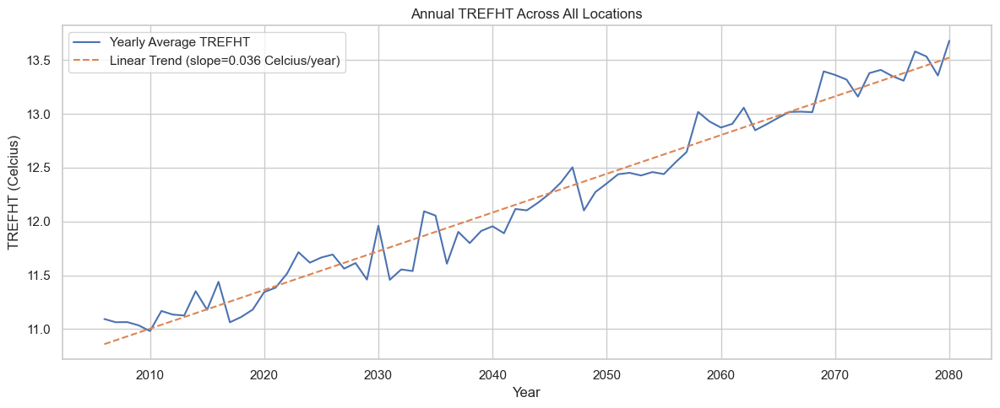

In [235]:
# 2. Trend Analysis (Annual Means + Linear Regression)
annual_means = trefht_df.groupby("year")["TREFHT"].mean().reset_index()

# Linear regression
slope, intercept, r_value, p_value, std_err = linregress(annual_means["year"], annual_means["TREFHT"])
trend_line = intercept + slope * annual_means["year"]

plt.figure(figsize=(12, 5))
plt.plot(annual_means["year"], annual_means["TREFHT"], label="Yearly Average TREFHT")
plt.plot(annual_means["year"], trend_line, label=f"Linear Trend (slope={slope:.3f} Celcius/year)", linestyle="--")
plt.title("Annual TREFHT Across All Locations")
plt.xlabel("Year")
plt.ylabel("TREFHT (Celcius)")
plt.legend()
plt.tight_layout()
plt.show()

This graph illustrates the annual mean TREFHT across all locations from 2006 to 2080, along with a linear trend line representing a clearer long-term temperature increase. While the overall trend is upward, there are fluctuations in yearly temperature, which could be influenced by natural climate variability, regional weather patterns, or short-term anomalies.

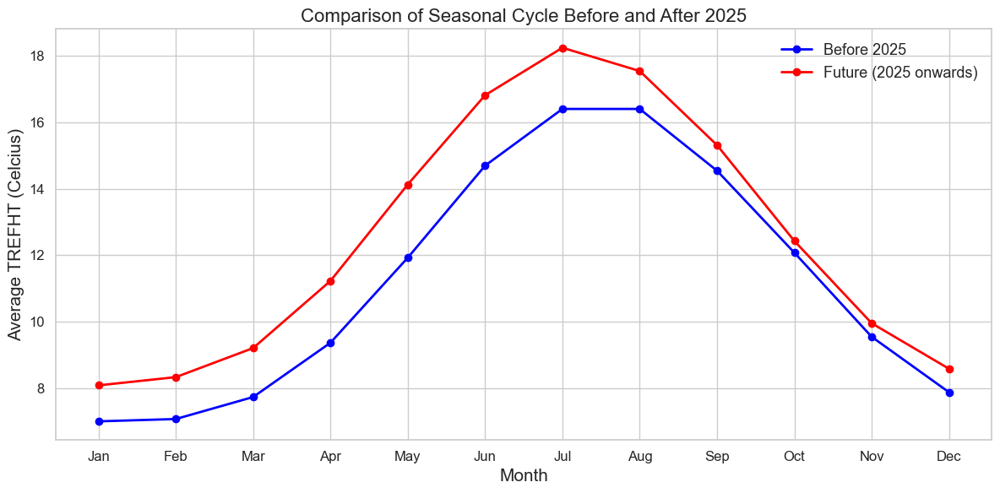

In [236]:
# 3. Seasonal Cycle - Monthly Means Across All Years

# Split the dataset into historical (before 2025) and future (2025 onwards)
historical_data = trefht_df[trefht_df.index.year < 2025]
future_data = trefht_df[trefht_df.index.year >= 2025]

# Calculate the monthly average TREFHT for both periods
historical_monthly = historical_data.groupby(historical_data.index.month)["TREFHT"].mean()
future_monthly = future_data.groupby(future_data.index.month)["TREFHT"].mean()

# Plot the seasonal comparison
plt.figure(figsize=(12, 6))
plt.plot(historical_monthly.index, historical_monthly.values, marker='o', linestyle='-', linewidth=2, markersize=6, color='blue', label="Before 2025")
plt.plot(future_monthly.index, future_monthly.values, marker='o', linestyle='-', linewidth=2, markersize=6, color='red', label="Future (2025 onwards)")

# Add labels and title
plt.xlabel('Month', fontsize=15)
plt.ylabel('Average TREFHT (Celcius)', fontsize=15)
plt.title("Comparison of Seasonal Cycle Before and After 2025", fontsize=16)
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(frameon=False, fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()

The red line is consistently above the blue line for all months, supporting our previous hypothesis of a general warming trend. The temperature difference between the warmest and coldest months appears to be greater in the future (red line), again, suggesting that temperature extremes—both highs and lows—may become more pronounced in the future. Future summers will be ~12.5% hotter, while winters will warm more modestly but remain milder overall. The transition between winter and summer temperatures appears to be steeper in future, which could indicate shorter transitional seasons (spring and autumn).

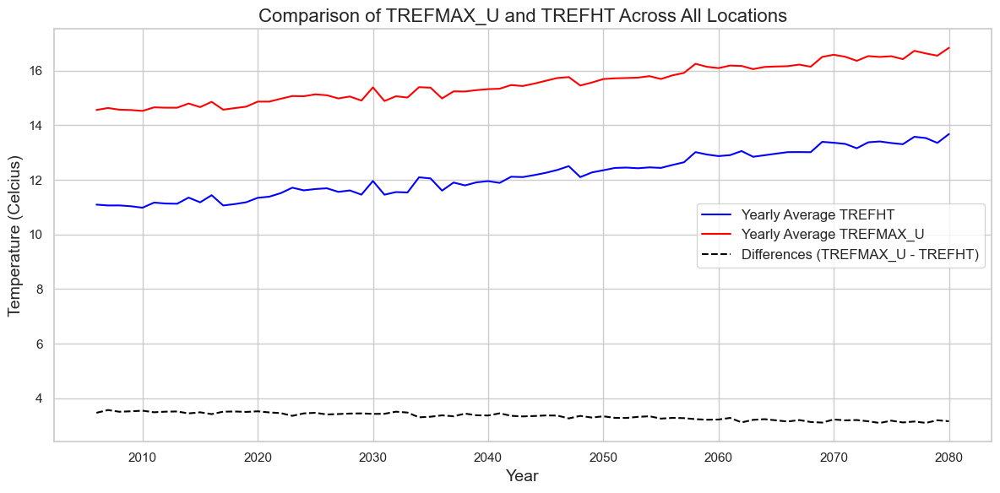

In [237]:
# 4. Comparison between TREFHT and TREFMAX_U

# Compute annual means for TREFMAX_U
trefmax_annual = ds["TREFMXAV_U"].mean(dim=["lat", "lon"]).groupby("time.year").mean()

# Ensure both datasets are aligned and stored in a DataFrame
annual_df = trefht_annual.to_frame(name="TREFHT").reset_index()
annual_df["TREFMAX_U"] = trefmax_annual.values

# Compute the gap between maximum and mean temperature
annual_df["Temperature_Gap"] = annual_df["TREFMAX_U"] - annual_df["TREFHT"]

# Plot the trends
plt.figure(figsize=(12, 6))

# Plot annual trends
plt.plot(annual_df["year"], annual_df["TREFHT"], label="Yearly Average TREFHT", color="blue", linestyle="-")
plt.plot(annual_df["year"], annual_df["TREFMAX_U"], label="Yearly Average TREFMAX_U", color="red", linestyle="-")

# Plot the gap as a separate trend
plt.plot(annual_df["year"], annual_df["Temperature_Gap"], label="Differences (TREFMAX_U - TREFHT)", color="black", linestyle="--")

# Labels and title
plt.xlabel("Year", fontsize=14)
plt.ylabel("Temperature (Celcius)", fontsize=14)
plt.title("Comparison of TREFMAX_U and TREFHT Across All Locations", fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

Both mean and maximum temperatures are rising steadily, with future years showing consistently higher values. Despite the warming trend, the gap between maximum and mean temperatures remains stable, indicating that both are increasing at a similar rate. This suggests that while climate warming is evident, the increase in extreme heat events (relative to the mean) is not accelerating disproportionately. 

##### C.2 Spatiotemporal Analysis

In [238]:
# Extract lat/lon + convert lon if needed
lats = ds.lat.values
lons = ds.lon.values
lons = np.where(lons > 180, lons - 360, lons)
lon_grid, lat_grid = np.meshgrid(lons, lats)

In [239]:
# Function to plot spatial map of TREFHT
def plot_trefht_map(data, title):
    plt.figure(figsize=(10, 6))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.gridlines(draw_labels=True)
    
    # Plot
    mesh = plt.pcolormesh(lon_grid, lat_grid, data, transform=ccrs.PlateCarree(), shading='auto')
    plt.colorbar(mesh, orientation='vertical', label='TREFHT (K)')
    plt.title(title)
    plt.show()

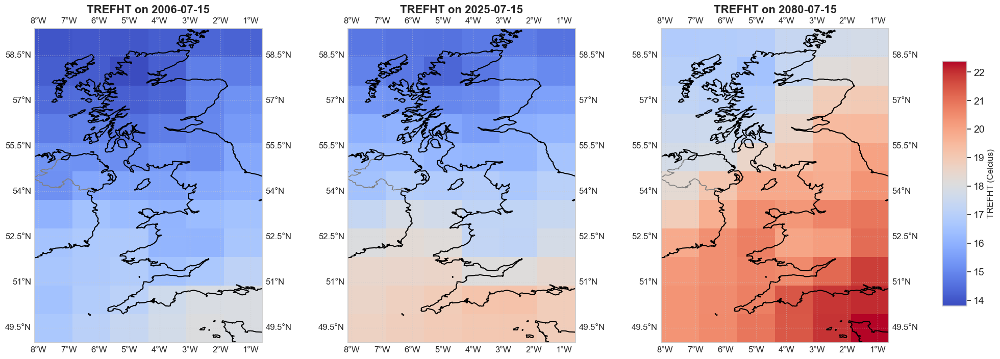

In [240]:
# 1. Comparison of 3 specific dates in peak summer (15 July)

# Define dates
desired_dates = ['2006-07-15', '2025-07-15', '2080-07-15']

# Extract available dates
available_dates = [str(t.values)[:10] for t in ds.time]
selected_dates = []
for date in desired_dates:
    if date in available_dates:
        selected_dates.append(date)
    else:
        closest_date = min(available_dates, key=lambda d: abs(np.datetime64(d) - np.datetime64(date)))
        print(f"Date {date} not found. Using closest available date: {closest_date}")
        selected_dates.append(closest_date)

# Extract temperature data
trefht_maps = [ds.TREFHT.sel(time=date).values for date in selected_dates]

# Determine common color scale for all maps
vmin = min(np.nanmin(data) for data in trefht_maps)
vmax = max(np.nanmax(data) for data in trefht_maps)

# Plot
fig, axes = plt.subplots(1, 3, figsize=(24, 8), subplot_kw={'projection': ccrs.PlateCarree()})
titles = [f"TREFHT on {date}" for date in selected_dates]
fig.subplots_adjust(right=0.85)

for ax, data, title in zip(axes, trefht_maps, titles):
    ax.set_title(title, fontsize=16, fontweight='bold')
    ax.coastlines(linewidth=1.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1.2, edgecolor="gray")
    ax.gridlines(draw_labels=True, linestyle='dotted', alpha=0.5)

    mesh = ax.pcolormesh(lon_grid, lat_grid, data, transform=ccrs.PlateCarree(),
                          shading='auto', cmap='coolwarm', vmin=vmin, vmax=vmax)

# Create a separate colorbar axis to move it further right
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6])  # [left, bottom, width, height]
cbar = fig.colorbar(mesh, cax=cbar_ax, orientation='vertical', label='TREFHT (Celcius)')
cbar.ax.tick_params(labelsize=14)

plt.show()

The graph illustrates the changes in TREFHT across the UK on 15 July (peak summer) in the years 2006, 2025, and 2080. A clear warming trend is observed over time, with temperatures in 2006 predominantly below 16°C, while in 2025, slight warming appears, especially in southern regions. By 2080, there is a significant temperature increase, with most of England experiencing temperatures above 19°C, and some southern areas exceeding 22°C. This pattern suggests an overall warming trend due to climate change, with increasing summer temperatures, particularly in the south.

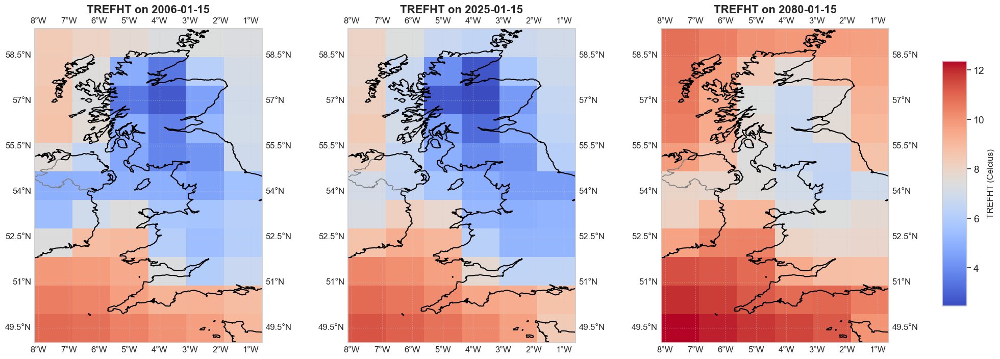

In [241]:
# 2. Comparison of 3 specific dates in peak winter (15 January)

# Define dates
desired_dates = ['2006-01-15', '2025-01-15', '2080-01-15']

# Extract available dates
available_dates = [str(t.values)[:10] for t in ds.time]
selected_dates = []
for date in desired_dates:
    if date in available_dates:
        selected_dates.append(date)
    else:
        closest_date = min(available_dates, key=lambda d: abs(np.datetime64(d) - np.datetime64(date)))
        print(f"Date {date} not found. Using closest available date: {closest_date}")
        selected_dates.append(closest_date)

# Extract temperature data
trefht_maps = [ds.TREFHT.sel(time=date).values for date in selected_dates]

# Determine common color scale for all maps
vmin = min(np.nanmin(data) for data in trefht_maps)
vmax = max(np.nanmax(data) for data in trefht_maps)

# Plot
fig, axes = plt.subplots(1, 3, figsize=(24, 8), subplot_kw={'projection': ccrs.PlateCarree()})
titles = [f"TREFHT on {date}" for date in selected_dates]
fig.subplots_adjust(right=0.85)

for ax, data, title in zip(axes, trefht_maps, titles):
    ax.set_title(title, fontsize=16, fontweight='bold')
    ax.coastlines(linewidth=1.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1.2, edgecolor="gray")
    ax.gridlines(draw_labels=True, linestyle='dotted', alpha=0.5)

    mesh = ax.pcolormesh(lon_grid, lat_grid, data, transform=ccrs.PlateCarree(),
                          shading='auto', cmap='coolwarm', vmin=vmin, vmax=vmax)

# Create a separate colorbar axis to move it further right
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6])  # [left, bottom, width, height]
cbar = fig.colorbar(mesh, cax=cbar_ax, orientation='vertical', label='TREFHT (Celcius)')
cbar.ax.tick_params(labelsize=14)

plt.show()

The graph shows TREFHT across the UK on 15 January (peak winter) in 2006, 2025, and 2080, showing a clear warming trend. In 2006, temperatures were predominantly below 6°C, with Scotland experiencing the coldest conditions. By 2025, slight warming is observed, but much of the UK remains below 8°C. By 2080, temperatures rise significantly, with much of England exceeding 10°C, and southern regions surpassing 12°C. This pattern highlights a gradual increase in winter temperatures, potentially reducing cold-related risks but also affecting ecosystems and weather patterns.

In [242]:
# 3. Animation of TREFHT trends in all locations

# Convert longitudes (if needed)
ds['lon'] = xr.where(ds['lon'] > 180, ds['lon'] - 360, ds['lon'])

# Compute yearly mean TREFHT
annual_mean = ds.TREFHT.groupby("time.year").mean("time")

# Plot
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={"projection": ccrs.PlateCarree()})

# Add coastlines and borders
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=":")

# Define color limits
vmin, vmax = annual_mean.min(), annual_mean.max()

# Function to update animation frame
def animate(i):
    ax.clear()
    
    # Re-add map features
    ax.set_extent([ds.lon.min(), ds.lon.max(), ds.lat.min(), ds.lat.max()], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=":")
    
    # Get data for the current year
    data = annual_mean.isel(year=i)
    
    # Plot temperature
    pcm = ax.pcolormesh(ds.lon, ds.lat, data, cmap="coolwarm", shading="auto", vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())

    # Set title and labels
    ax.set_title(f"TREFHT Annual Mean - Year: {int(annual_mean.year[i].values)}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    return pcm,

# Generate Animation
ani = animation.FuncAnimation(fig, animate, frames=len(annual_mean.year), interval=200)

# Save as gif
ani.save("trefht_animation.gif", writer="pillow", fps=5)

# Display inline
plt.close()
HTML(ani.to_jshtml())

##### D. Correlation Analysis

##### D.1 Examine linearity between variables

In [243]:
# List of variables excluding TREFHT
variables = [var for var in ds.data_vars if var != 'TREFHT']

# Flatten the data: reshape (time, lat, lon) into 2D (time, space)
def flatten_variable(var):
    return ds[var].stack(space=("lat", "lon")).transpose("time", "space").values

# Flatten all variables into a DataFrame
data = {var: flatten_variable(var) for var in variables}
data['TREFHT'] = flatten_variable('TREFHT')

# Create a DataFrame with spatially averaged time series for each variable
df = pd.DataFrame({var: values.mean(axis=1) for var, values in data.items()})

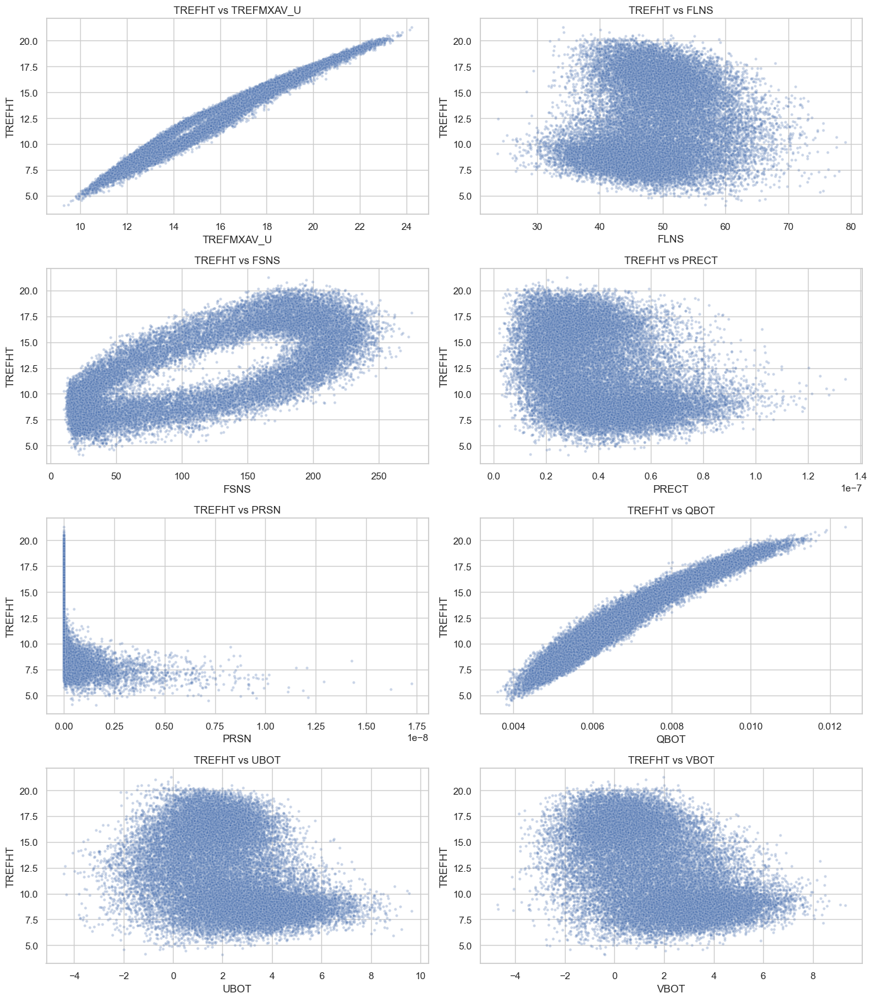

In [244]:
# Set up plot style
sns.set(style="whitegrid")
num_vars = len(variables)

# Set up plot grid
fig, axes = plt.subplots(nrows=(num_vars + 1) // 2, ncols=2, figsize=(14, 4 * ((num_vars + 1) // 2)))
axes = axes.flatten()

# Create scatter plots
for i, var in enumerate(variables):
    ax = axes[i]
    sns.scatterplot(x=df[var], y=df['TREFHT'], ax=ax, alpha=0.3, s=10)
    ax.set_xlabel(var)
    ax.set_ylabel("TREFHT")
    ax.set_title(f"TREFHT vs {var}")

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

From the above scatter plots, we can see that the relationship between TREFHT (our target variable) and other variables are most likely non-linear. So we will use spearman correlation matrix to examine this non-linear relationship.

##### D.2 Spearman Correlation Matrix

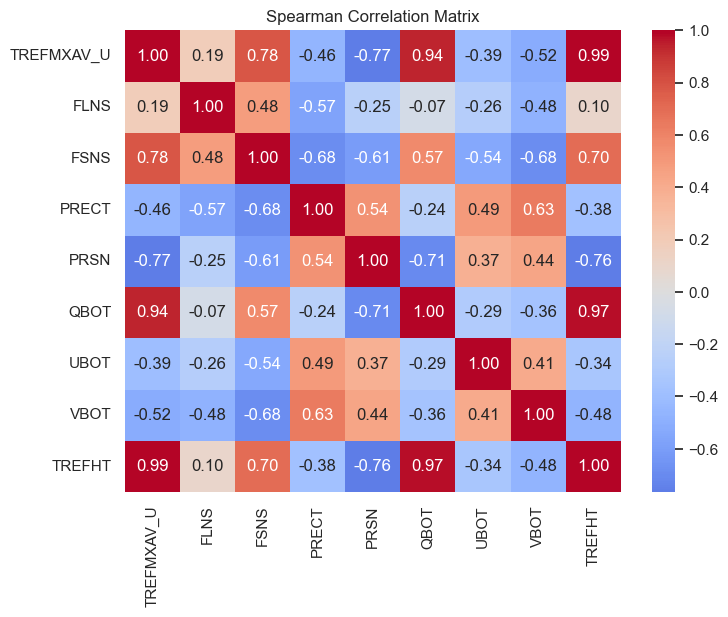

Spearman Correlation with TREFHT:
TREFMXAV_U    0.986406
QBOT          0.972614
FSNS          0.699090
FLNS          0.102738
UBOT         -0.339223
PRECT        -0.378928
VBOT         -0.475227
PRSN         -0.763719
Name: TREFHT, dtype: float64


In [253]:
# Compute Spearman correlation matrix (spatial factors ignored / all locations averaged)
spearman_corr_matrix = df.corr(method='spearman')

# Heatmap to visualize correlations
plt.figure(figsize=(8, 6))
sns.heatmap(spearman_corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Spearman Correlation Matrix")
plt.show()

# Get Spearman correlations with TREFHT
spearman_corr_with_trefht = spearman_corr_matrix['TREFHT'].drop('TREFHT').sort_values(ascending=False)

# Print the Spearman correlations
print("Spearman Correlation with TREFHT:")
print(spearman_corr_with_trefht)

Overall, temperature, humidity, and solar radiation emerge as key drivers of TREFHT, while precipitation and wind effects vary by context. The spearman correlation matrix shows that TREFMXAV_U (ρ = 0.99) and QBOT (ρ = 0.97) are most strongly correlated with TREFHT, reflecting expected physical relationships, though TREFMXAV_U may introduce multicollinearity. FSNS (ρ = 0.70) also shows a strong positive link, highlighting the role of solar radiation in surface warming.

In contrast, PRSN (ρ = -0.76), VBOT (ρ = -0.48), and PRECT (ρ = -0.38) are negatively correlated with TREFHT, suggesting cooler conditions align with increased snowfall, precipitation, and specific wind patterns. FLNS, UBOT, and PRECT show weaker or less consistent associations.

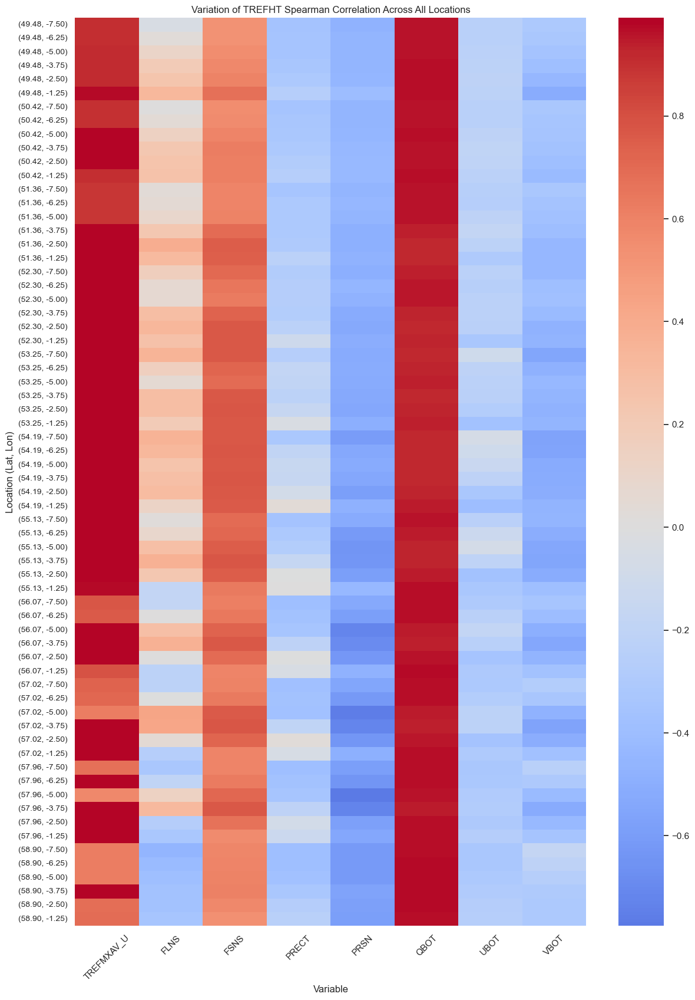

In [254]:
# Compare spearman correlation matrix across all locations to see if the key factors are consistent

# Stack lat and lon into a single space dimension
ds_stacked = ds.stack(space=("lat", "lon"))

# Get all 66 unique locations
locations = ds_stacked.space.values

# Dictionary to store correlation results
corr_results = {loc: None for loc in locations}  # Ensures all locations are included

# Compute Spearman correlations separately for each (lat, lon)
for loc in locations:
    # Extract time series for this specific location
    df_loc = pd.DataFrame({var: ds_stacked[var].sel(space=loc).values for var in ds.data_vars})

    # Ensure enough variability exists before computing correlation
    if df_loc.nunique().sum() == 0:
        continue  # Skip locations with no variation

    # Drop NaN values before computing correlation
    df_loc = df_loc.dropna()

    # Ensure there is enough data for correlation
    if df_loc.shape[0] > 2:  # At least 3 time points needed
        spearman_corr = df_loc.corr(method='spearman')

        # Store correlation with TREFHT if available
        if "TREFHT" in spearman_corr.columns:
            corr_results[loc] = spearman_corr["TREFHT"].drop("TREFHT", errors="ignore")

# Convert dictionary to DataFrame
corr_df = pd.DataFrame(corr_results).T  # Transpose so locations are rows

# Rename index
corr_df.index = [f"({lat:.2f}, {lon:.2f})" for lat, lon in ds_stacked.space.to_index()]

# Fill missing correlations with 0 (so all locations appear)
corr_df = corr_df.fillna(0)

# Ensure all 66 locations are included
if corr_df.shape[0] < 66:
    print(f"Warning: Only {corr_df.shape[0]} out of 66 locations are displayed. Some locations may still be missing.")

# Plot
plt.figure(figsize=(14, 20))  # Increase height to show all 66 locations clearly
sns.heatmap(corr_df, annot=False, cmap="coolwarm", center=0)

# Adjust labels
plt.xticks(rotation=45)  # Rotate x-axis labels for better spacing
plt.yticks(rotation=0, fontsize=10)  # Adjust y-axis font size

# Add labels and title
plt.xlabel("Variable")
plt.ylabel("Location (Lat, Lon)")
plt.title("Variation of TREFHT Spearman Correlation Across All Locations")

# Save map to jpg
plt.savefig("spearman_all_locations.jpg", dpi=300, bbox_inches="tight", format="jpg")

# Show the heatmap
plt.show()

Comparing the two Spearman correlation heatmaps, we see that while the globally averaged correlations (Spearman 1) highlight QBOT, PRSN, and FSNS as the strongest positive drivers of TREFHT, this pattern holds largely but not entirely consistently across individual locations (Spearman 2). In the per-location heatmap, QBOT, FSNS, and PRSN maintains quite high correlations with TREFHT in nearly all locations, confirming their strong and stable relationship. However, FLNS and wind variables (UBOT, VBOT) show greater spatial variability in their correlation with TREFHT. This indicates that while some key factors are consistently influential, others have more location-dependent impacts on surface temperature. Overall, the core relationships are preserved (QBOT, FSNS, PRSN), but spatial heterogeneity should be considered in localized modeling.